# Problem set 2 (40 + 36 + 35 = 111 pts)

In this problem set we also present some bonus problems that will be considered as in Problem Set 1.

## Problem 1. Segmentation. (40 pts)
In this task, you will need to solve the problem of semantic segmentation of the attributes of a person's face. You will work with [CelebAMask-HQ](https://github.com/switchablenorms/CelebAMask-HQ) dataset. You are free to solve and implement required steps on your own. However, there are several constraints and advices:
- To speed up and simplify experiments, you can transform images to 512x512 resolution and use this [train-test split](https://drive.google.com/file/d/1vO4mJ08FMdcom2-sNs4WHxPztIRYrFYI/view?usp=share_link), that has smaller number of images.
- (20 pts) Implement needed train-test pipeline (dataset, model, train and test loops), train and test the model. 
  - (10 pts) Bonus: your own model, not taken from libraries and not a Unet.
- (5 pts) Report IoU and Dice-scores of each class on the test set.
- (5 pts) Try to add augmentations (helpful [link1](https://albumentations.ai/) and [link2](https://kornia.github.io/)).
- (2 pts) Plot 4-6 examples of obtained results on the test set (show the best and the worst according to the loss/metrics).
- (3 pts) Explain why you solved the problem this way and not otherwise, provide description of experiments and their results. Analyze your metrics, are they suitable?
- (5 pts) Make additional function for inference that receives path to the image. Test your model on several photos not from the dataset (pick your own photo or any other from internet). Does your model work well on the new data?
- Do not use already pretrained on CelebAMask-HQ models.
- **Bonus**: 
  - **+10 points** for top-1 result
  - **+8 points** for 2-3 places
  - **+5 points** for 4-8 places 
according to reported mean Dice score on the provided test split.

In [17]:
!pip install gdown -q
!pip install -U albumentations -q

In [18]:
import gdown
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import glob
from shutil import copyfile

import torchvision.datasets as dsets
from torchvision import transforms
import torch.nn.functional as F
import torch.nn as nn

from PIL import Image
import os
from tqdm import tqdm
import gc
import albumentations as A
from albumentations.pytorch import ToTensorV2
from albumentations.augmentations.geometric.resize import Resize

In [3]:
!gdown 1M1asebzsGWrT4czPu5quKoCYY_ARjSHS
!gdown 1PrfZu3WmWmvRWDocO1itUCKhnuWy0Nwo

Downloading...
From (uriginal): https://drive.google.com/uc?id=1M1asebzsGWrT4czPu5quKoCYY_ARjSHS
From (redirected): https://drive.google.com/uc?id=1M1asebzsGWrT4czPu5quKoCYY_ARjSHS&confirm=t&uuid=0eb16d6e-aa89-457f-bd07-4d6202cee25c
To: /kaggle/working/celebadata.zip
100%|████████████████████████████████████████| 485M/485M [00:35<00:00, 13.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1PrfZu3WmWmvRWDocO1itUCKhnuWy0Nwo
To: /kaggle/working/task1.zip
100%|████████████████████████████████████████| 476k/476k [00:00<00:00, 1.11MB/s]


In [4]:
!unzip -qq celebadata.zip
!unzip -qq task1.zip

In [19]:
def generate_label_plain(inputs): #predicts
    pred_batch = inputs.data.max(1)[1].cpu()
    return pred_batch

def label_transform(labels): # one-hot encoding of labels
    size = labels.size()
    labels = labels.view(size[0], 1, size[1], size[2])
    oneHot_size = (size[0], num_classes, size[1], size[2])
    labels_real = torch.FloatTensor(torch.Size(oneHot_size)).zero_()
    labels_real = labels_real.scatter_(1, labels.data.long(), 1.0)

    return labels_real

class CelebAMaskDataset():
    def __init__(self, img_path, label_path, transform):
        self.img_path = img_path
        self.label_path = label_path
        self.transform = transform
        self.dataset = []
        self.preprocess()
        self.num_images = len(self.dataset)


    def preprocess(self):
        for i in range(len([name for name in os.listdir(self.img_path) if os.path.isfile(os.path.join(self.img_path, name))])):
            img_path = os.path.join(self.img_path, str(i)+'.jpg')
            label_path = os.path.join(self.label_path, str(i)+'.png')
            self.dataset.append([img_path, label_path])
            
        print('Finished preprocessing the CelebA dataset...')

    def __getitem__(self, index):
        img_path, label_path = self.dataset[index]
        image = Image.open(img_path)
        label = Image.open(label_path)
        transformed = self.transform(image=np.array(image), mask=np.array(label))
        transformed_image = transformed['image']
        transformed_mask = transformed['mask']

        return transformed_image, transformed_mask 

    def __len__(self):
        """Return the number of images."""
        return self.num_images
    
class Colorize(object):
    def __init__(self, n=19):
        self.cmap = np.array([(0,  0,  0), (204, 0,  0), (76, 153, 0),
                     (204, 204, 0), (51, 51, 255), (204, 0, 204), (0, 255, 255),
                     (51, 255, 255), (102, 51, 0), (255, 0, 0), (102, 204, 0),
                     (255, 255, 0), (0, 0, 153), (0, 0, 204), (255, 51, 153), 
                     (0, 204, 204), (0, 51, 0), (255, 153, 51), (0, 204, 0)], 
                     dtype=np.uint8) 
        self.cmap = torch.from_numpy(self.cmap[:n])

    def __call__(self, gray_image):
        size = gray_image.size()
        color_image = torch.ByteTensor(3, size[1], size[2]).fill_(0)

        for label in range(0, len(self.cmap)):
            mask = (label == gray_image[0]).cpu()
            color_image[0][mask] = self.cmap[label][0]
            color_image[1][mask] = self.cmap[label][1]
            color_image[2][mask] = self.cmap[label][2]

        return color_image

In [20]:
imsize = 512
num_classes = 19

train_transform = A.Compose([
    Resize(imsize, imsize),
    A.HorizontalFlip(p=0.2),
    A.VerticalFlip(p=0.2),
    A.RandomRotate90(p=0.2),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2(),
])

test_transform = A.Compose([
    Resize(imsize, imsize),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2(),
])

In [21]:
batch_size = 4 # maximum number which fits into gpu

train_dataset = CelebAMaskDataset('./train_img', './train_label', train_transform)
test_dataset = CelebAMaskDataset('./test_img', './test_label', test_transform)
train_dataloader = torch.utils.data.DataLoader(dataset=train_dataset,
                                             batch_size=batch_size,
                                             shuffle=True,
                                             num_workers=2,
                                             drop_last=False)

test_dataloader = torch.utils.data.DataLoader(dataset=test_dataset,
                                             batch_size=batch_size,
                                             shuffle=False,
                                             num_workers=2,
                                             drop_last=False)

Finished preprocessing the CelebA dataset...
Finished preprocessing the CelebA dataset...


In [22]:
class Features(nn.Module):
    def __init__(self, hidden=256):
        super(Features, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.bn5 = nn.BatchNorm2d(256)
        self.conv6 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)
        self.bn6 = nn.BatchNorm2d(512)
        self.conv7 = nn.Conv2d(512, hidden, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.bn5(self.conv5(x)))
        x = F.relu(self.bn6(self.conv6(x)))
        x = self.conv7(x)
        return x

class ASPP(torch.nn.Module):
    def __init__(self, in_channels=2048, out_channels=256, rates=[6, 12, 18]):
        super(ASPP, self).__init__()
        self.conv1 = torch.nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.conv2 = torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=rates[0], padding=rates[0])
        self.conv3 = torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=rates[1], padding=rates[1])
        self.conv4 = torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=rates[2], padding=rates[2])
        self.pool = torch.nn.AdaptiveAvgPool2d(1)
        self.conv5 = torch.nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.conv6 = torch.nn.Conv2d(out_channels*5, out_channels, kernel_size=1)
        self.dropout = torch.nn.Dropout(p=0.5)
        
    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x)
        x3 = self.conv3(x)
        x4 = self.conv4(x)
        x5 = self.pool(x)
        x5 = self.conv5(x5)
        x5 = F.interpolate(x5, size=x4.size()[2:], mode='nearest')
        x = torch.cat([x1, x2, x3, x4, x5], dim=1)
        x = self.conv6(x)
        x = self.dropout(x)
        return x


class MyModel(torch.nn.Module):
    def __init__(self, num_classes=19):
        super(MyModel, self).__init__()
        self.features = Features(hidden=512)
        self.aspp = ASPP(in_channels=512)
        self.fc1 = torch.nn.Conv2d(256, num_classes, 1)

    def forward(self, x):
        x = self.features(x)
        x = self.aspp(x)
        x = self.fc1(x)
        x = F.interpolate(x, size=(x.size(2) * 4, x.size(3) * 4), mode='bilinear', align_corners=True)
        return x

In [23]:
# class Encoder_Block(torch.nn.Module):
#     def __init__(self,inp_channels,out_channels):
#         super().__init__()
#         self.model = torch.nn.Sequential(
#            torch.nn.Conv2d(inp_channels, out_channels, kernel_size=3, padding=1),
#            torch.nn.BatchNorm2d(out_channels),
#            torch.nn.ReLU(),
#            torch.nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
#            torch.nn.BatchNorm2d(out_channels),
#            torch.nn.ReLU()
#         )
#         self.pooling = torch.nn.MaxPool2d(2)
#     def forward(self,x):
#         int_out = self.model(x)
#         return self.pooling(int_out), int_out

# class Decoder_Block(torch.nn.Module):
#     def __init__(self,inp_channels,out_channels):
#         super().__init__()
#         self.upsample = torch.nn.ConvTranspose2d(inp_channels, out_channels, kernel_size=2, stride=2)
#         self.model = torch.nn.Sequential(
#            torch.nn.Conv2d(inp_channels, out_channels, kernel_size=3, padding=1),
#            torch.nn.BatchNorm2d(out_channels),
#            torch.nn.ReLU(),
#            torch.nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
#            torch.nn.BatchNorm2d(out_channels),
#            torch.nn.ReLU()
#         )
#     def forward(self,x,enc_x):
#         x = self.upsample(x)
#         x = torch.cat([x, enc_x], dim=1)
#         return self.model(x)

# class Unet(torch.nn.Module):
#     def __init__(self,inc,outc,hidden_size=64):
#         super().__init__()
#         self.Encoder = torch.nn.ModuleList([
#             Encoder_Block(inc, hidden_size),
#             Encoder_Block(hidden_size, hidden_size*2),
#             Encoder_Block(hidden_size*2, hidden_size*4),
#             Encoder_Block(hidden_size*4, hidden_size*8),
#         ])
#         self.bottleneck = torch.nn.Sequential(
#             torch.nn.Conv2d(hidden_size*8, hidden_size*16, kernel_size=1),
#             torch.nn.BatchNorm2d(hidden_size*16),
#             torch.nn.ReLU(),
#             torch.nn.Conv2d(hidden_size*16, hidden_size*16, kernel_size=1),
#             torch.nn.BatchNorm2d(hidden_size*16),
#             torch.nn.ReLU(),
#         )
#         self.Decoder = torch.nn.ModuleList([
#             Decoder_Block(hidden_size*16, hidden_size*8),
#             Decoder_Block(hidden_size*8, hidden_size*4),
#             Decoder_Block(hidden_size*4, hidden_size*2),
#             Decoder_Block(hidden_size*2, hidden_size),
#         ])
#         self.last_layer = torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same")
  
#     def forward(self,x):
#         enc_xs = []
#         for module in self.Encoder:
#             x, enc_x = module(x)
#             enc_xs.append(enc_x)

#         enc_xs = enc_xs[::-1]
#         x = self.bottleneck(x)

#         for i,module in enumerate(self.Decoder):
#             x = module(x, enc_xs[i])

#         return self.last_layer(x)

In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [25]:
model = MyModel(19).to(device)
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)

In [26]:
label_counts = torch.tensor([5000., 5000., 4999.,  252., 4878., 4872., 4840., 4818., 2645., 2383., 
                             2940., 4977., 4984., 4876.,  220., 1337.,  269., 4855., 2863.])
label_list = ['skin', 'nose', 'eye_g', 'l_eye', 'r_eye', 'l_brow', 'r_brow', 'l_ear', 'r_ear', 
              'mouth', 'u_lip', 'l_lip', 'hair', 'hat', 'ear_r', 'neck_l', 'neck', 'cloth']
weights = max(label_counts) / label_counts

In [27]:
def train(model,dataloader,optimizer,loss_func=torch.nn.CrossEntropyLoss(weight=weights.to(device)),epochs=3, loss_step=100):
    model.train()
    for i in tqdm(range(epochs)):
        running_loss = 0
        for j, (x, y) in enumerate(dataloader):
            x = x.to(device)
            y = y.to(device).to(torch.long)
            out = model(x)
            loss = loss_func(out, y)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            if not (j % loss_step):
                print(f'epoch: {i}, batch: {j}, loss: {loss.item() / len(x)}')
        print(f'-----EPOCH {i} loss: {running_loss / len(dataloader.dataset)}-----')

In [28]:
def iou_batch(pred, target):
    intersection = (pred * target).sum((-2, -1))
    union = (pred + target).clamp(0, 1).sum((-2, -1))
    raw_iou = intersection / union
    raw_iou[raw_iou.isnan()] = 1
    return raw_iou.cpu().sum(0)

def dice_batch(pred, target):
    intersection = (pred * target).sum((-2, -1))
    joint = (pred + target).sum((-2, -1))
    raw_dice = 2 * intersection / joint
    raw_dice[raw_dice.isnan()] = 1
    return raw_dice.cpu().sum(0)

def calculate_iou(model, dataloader):
    iou_final = torch.zeros(num_classes-1)
    model.eval()
    with torch.no_grad():
        for x, y in tqdm(dataloader):
            out = model(x.to(device))
            pred = generate_label_plain(out)
            pred = label_transform(pred)
            y = label_transform(y)
            iou_final += iou_batch(pred, y)[1:]
    
    iou_final /= len(dataloader.dataset)
    return iou_final

def calculate_dice(model, dataloader):
    dice_final = torch.zeros(num_classes-1)
    model.eval()
    with torch.no_grad():
        for x, y in tqdm(dataloader):
            out = model(x.to(device))
            pred = generate_label_plain(out)
            pred = label_transform(pred)
            y = label_transform(y)
            dice_final += dice_batch(pred, y)[1:]
    
    dice_final /= len(dataloader.dataset)
    return dice_final
        

In [29]:
train(model, train_dataloader, optimizer, epochs=1)
gc.collect()
torch.cuda.empty_cache()

  0%|          | 0/1 [00:00<?, ?it/s]

epoch: 0, batch: 0, loss: 0.7416076064109802
epoch: 0, batch: 100, loss: 0.3425292372703552
epoch: 0, batch: 200, loss: 0.24266420304775238
epoch: 0, batch: 300, loss: 0.34144917130470276
epoch: 0, batch: 400, loss: 0.2254675179719925
epoch: 0, batch: 500, loss: 0.38737180829048157
epoch: 0, batch: 600, loss: 0.27664315700531006
epoch: 0, batch: 700, loss: 0.4886874854564667
epoch: 0, batch: 800, loss: 0.26232194900512695
epoch: 0, batch: 900, loss: 0.23566696047782898


100%|██████████| 1/1 [07:10<00:00, 430.28s/it]

-----EPOCH 0 loss: 0.3355673152446747-----


In [25]:
iou_scores = calculate_iou(model, test_dataloader)
gc.collect()
torch.cuda.empty_cache()
dice_scores = calculate_dice(model, test_dataloader)
gc.collect()
torch.cuda.empty_cache()

100%|██████████| 313/313 [02:35<00:00,  2.01it/s]


In [28]:
data = {'class': label_list, 'iou_score': iou_scores.numpy(), 'dice_score': dice_scores.numpy()}
df = pd.DataFrame(data=data)
df

,class,iou_score,dice_score
0,skin,0.684988,0.803255
1,nose,0.001006,0.001994
2,eye_g,0.026948,0.034762
3,l_eye,0.021600,0.021600
4,r_eye,0.021600,0.021600
5,l_brow,0.061935,0.105511
6,r_brow,0.037353,0.063555
7,l_ear,0.184685,0.203816
8,r_ear,0.190695,0.212882
9,mouth,0.195351,0.226367


In [30]:
model.eval()

best_ious = [0, 0]
worse_ious = [1, 1]

best_inds = [0, 0]
worse_inds = [0, 0]
for i, (x, y) in enumerate(tqdm(test_dataset)):
    x = x.to(device).unsqueeze(0)
    out = model(x)
    pred = generate_label_plain(out)
    pred = label_transform(pred)
    y = label_transform(y.unsqueeze(0))
    iou = torch.mean(iou_batch(pred, y)[1:]).item()
    if iou > best_ious[0]:
        if iou > best_ious[1]:
            best_inds[0] = best_inds[1]
            best_inds[1] = i
            best_ious[0] = best_ious[1]
            best_ious[1] = iou 
        else:
            best_inds[0] = i
            best_ious[0] = iou
    
    if iou < worse_ious[0]:
        if iou < worse_ious[1]:
            worse_inds[0] = worse_inds[1]
            worse_inds[1] = i
            worse_ious[0] = worse_ious[1]
            worse_ious[1] = iou 
        else:
            worse_inds[0] = i
            worse_ious[0] = iou

100%|██████████| 1250/1250 [02:13<00:00,  9.38it/s]


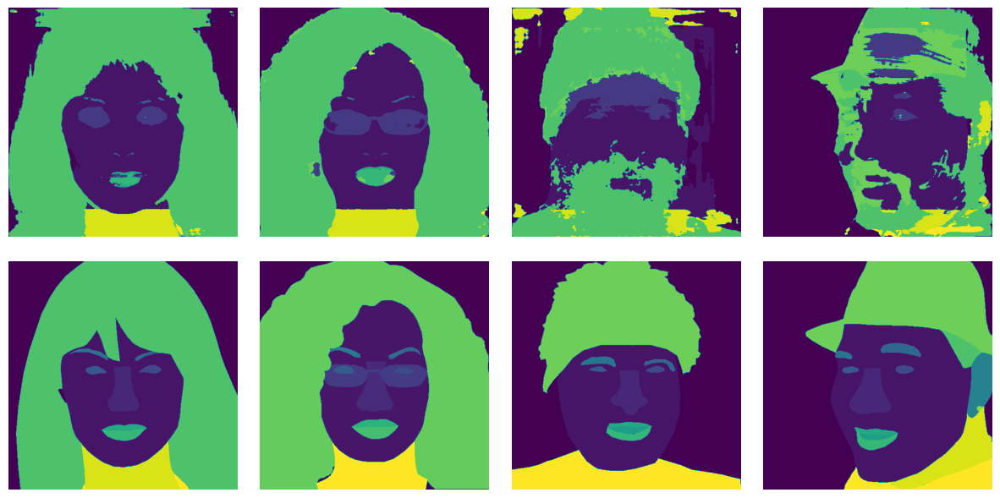

In [31]:
f, axes = plt.subplots(2, 4, figsize=(15, 15))

for i, ind in enumerate(best_inds + worse_inds):
    x, y = test_dataset[ind]
    x = x.to(device).unsqueeze(0)
    out = model(x)
    pred = generate_label_plain(out)

    axes[0, i].imshow(pred[0])
    axes[0, i].axis('off')
    axes[1, i].imshow(y)
    axes[1, i].axis('off')
    
plt.subplots_adjust(wspace=0.1, hspace=-0.65)

As we can see, some masks model predict pretty well. As model I used firstly simple Unet, very popular and easy to implement, which performs well for semantic segmmentation task. Then switched to my own iplementation to experiment. As augmentations I used albumination library, which easy to incorporate into torch Dataset pipeline and augment simultaneously image and mask.

In [30]:
def get_img(model, img_path, device=torch.device('cuda')):
    model.eval()
    img_transform = transforms.Compose([transforms.Resize((imsize, imsize)), 
                                transforms.ToTensor(), 
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    img = Image.open(img_path)
    x = img_transform(img)
    x = x.to(device).unsqueeze(0)
    out = model(x)
    pred = generate_label_plain(out)
    return pred

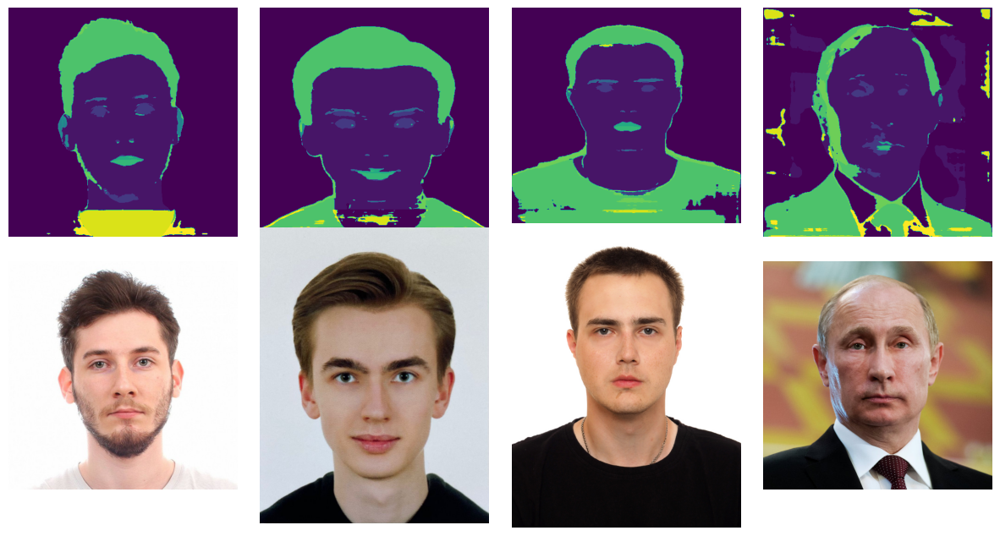

In [40]:
folder = 'task1/'
f, axes = plt.subplots(2, 4, figsize=(15, 15))

for i, path in enumerate(['egor.jpg', 'nik.jpg', 'me.jpg', 'put.jpg']):
    mask = get_img(model, folder+path)
    img = Image.open(folder+path)

    axes[0, i].imshow(mask[0])
    axes[0, i].axis('off')
    axes[1, i].imshow(img)
    axes[1, i].axis('off')

plt.subplots_adjust(wspace=0.1, hspace=-0.65)

## Problem 2. Deep image prior (36 pts)

In the deep prior framework, we aim to learn a prior distribution over the parameters $\theta$ of a generative model such that, given some observation $\hat{y}$, we can sample a plausible output $y$ from the learned prior distribution. The goal is to learn a posterior distribution $p(z,\theta|\hat{y})$ over the latent variable $z$ and the parameters $\theta$ such that, given some observation $\hat{y}$ (e.g., an image of a face), we can sample a plausible latent variable $z$ and generate a corresponding output image $y= f_\theta(z)$ that is similar to the observation. The conditional distribution of $y$ given $\hat{y}$ can be written as an integral over $z$ and $\theta$:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(z,\theta|\hat{y})dzd\theta$$

Unfortunately, in practice, it is difficult to compute this integral exactly, since we don't know the conditional distribution $p(y|z,\theta,\hat{y})$ and the posterior distribution $p(z,\theta|\hat{y})$. Instead, we can use an optimization approach to learn the prior distribution $p(z,\theta)$ and the network $f_\theta(z)$ that best approximate the true conditional distribution.

Specifically, we first assume that the latent variable $z$ is independent of the observation $\hat{y}$, i.e., $p(z,\theta|\hat{y}) = p(\theta|\hat{y})p(z)$. This allows us to rewrite the conditional distribution of $y$ as:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Next, we use an optimization approach to learn the parameters $\theta$ of the network to minimize the expected distance between the generated output $y=f_\theta(z)$ and the observation $\hat{y}$:

$$\min_\theta E(f_\theta(z),\hat{y})$$

To perform this optimization, we can apply a stochastic gradient descent approach where we sample random values of $z$ from the prior distribution $p(z)$ and compute the gradients of the loss function with respect to $\theta$ using backpropagation. This way, we can iteratively update the parameters of the network to improve its ability to generate realistic outputs given the observed data.

This approach is used to perform denoising, inpainting and super resolution. The basic architecture for the task is UNet, which we will use in our experiments.

## Implementation

In [81]:
import torch
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torchvision
from torchvision import transforms
import gdown
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchmetrics import TotalVariation as TV

In [82]:
class Encoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.downsample = torch.nn.MaxPool2d(2)
    def forward(self,x):
        int_out = self.model(x)
        return self.downsample(int_out), int_out

class Decoder_Block(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
    def forward(self,x,enc_x):
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)

In [83]:
class Unet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block(hidden_size*16,hidden_size*8),
            Decoder_Block(hidden_size*8,hidden_size*4),
            Decoder_Block(hidden_size*4,hidden_size*2),
            Decoder_Block(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [84]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [89]:
sharing_link = "https://drive.google.com/file/d/1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU/view?usp=share_link"
gdown.download(url=sharing_link, output="./data.zip", quiet=False, fuzzy=True)
!unzip ./data.zip

Downloading...
From: https://drive.google.com/uc?id=1QMZ9_XdFRfj-arUvW_hlG5Mw8vjzTLsU
To: /kaggle/working/data.zip
100%|██████████| 1.60M/1.60M [00:00<00:00, 149MB/s]


Archive:  ./data.zip
   creating: data/
   creating: data/denoising/
  inflating: data/denoising/F16_GT.png  
  inflating: data/denoising/snail.jpg  
   creating: data/inpainting/
  inflating: data/inpainting/kate.png  
  inflating: data/inpainting/kate_mask.png  
  inflating: data/inpainting/library.png  
  inflating: data/inpainting/library_mask.png  
  inflating: data/inpainting/vase.png  
  inflating: data/inpainting/vase_mask.png  


In [90]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [91]:
img = transform(Image.open("./data/denoising/F16_GT.png"))[None].to(device)

## Your work starts here

In [92]:
noise_strength = 0.1
corrupted_img = (img + torch.randn_like(img)*noise_strength).clamp(0,1)

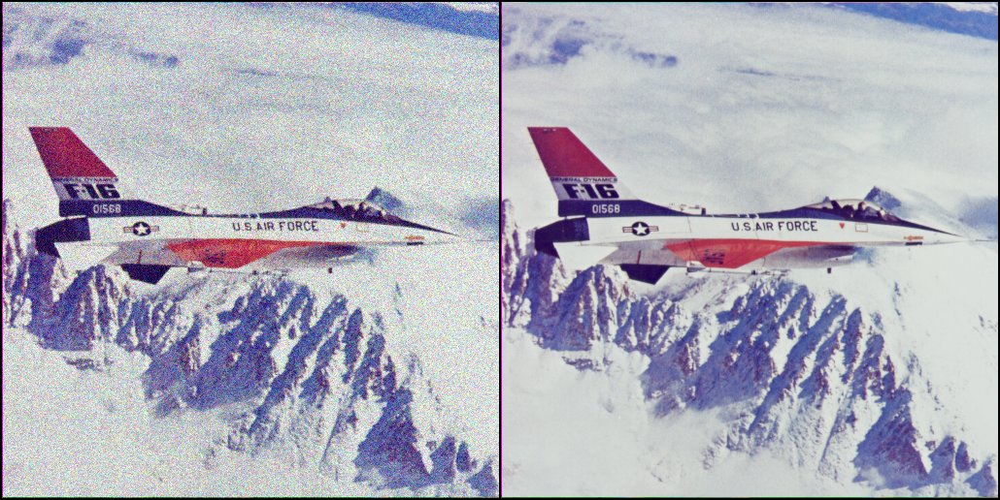

In [93]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

## Optimization (6 pts)

Task: Implement an optimization function that takes a model, input image, corrupted image, original image, and the number of iterations as arguments.

Steps:

1. Initialize an optimizer (Adam optimizer with learning rate $10^{-4}$).
2. Write a cycle for optimization using the specified loss function (criterion).
3. In each step of the cycle, add a certain amount of noise (reg_noise=0.01) to the input $z$ to ensure computational stability.

**We have provided baseline values for hyperparameters in this and future tasks, but feel free to make adjustments if needed.**

In [94]:
def optimization(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    train_losses = []
    val_losses = []
    for step in tqdm(range(iters)):
        model.train()
        out = model(z+torch.normal(0, reg_noise, z.size()).to(device))
        loss_train = criterion(out, corrupted_img)
        
        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()
        
        with torch.no_grad():
            model.eval()
            out = model(z)
            loss_val = criterion(out, orig_img)
        
        train_losses.append(loss_train.item())
        val_losses.append(loss_val.item())
    
    return train_losses, val_losses

### Run the optimization (6 pts):

1. Start by initializing the UNet model with 32 input channels, 3 output channels, and a hidden size of 16.
2. Create a model input of size (1, 32, img.size(2), img.size(3)) by sampling from a normal distribution with a mean of 0 and standard deviation of 0.1.
3. Train the model for 3000 iterations.
4. Plot the training convergence with the loss computed for both generated and corrupted images.
5. Plot the training convergence with the loss computed for both generated and original images.
6. Visualize the results, including the original image, the corrupted image, and the restored image.
7. Explain obtained results (**Hint: look closely at the plot from step 5**)

In [95]:
unet = Unet(32, 3, 16).to(device)
z = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)

In [96]:
train_losses, val_losses = optimization(unet, z, corrupted_img, img, 3000)

100%|██████████| 3000/3000 [08:17<00:00,  6.03it/s]


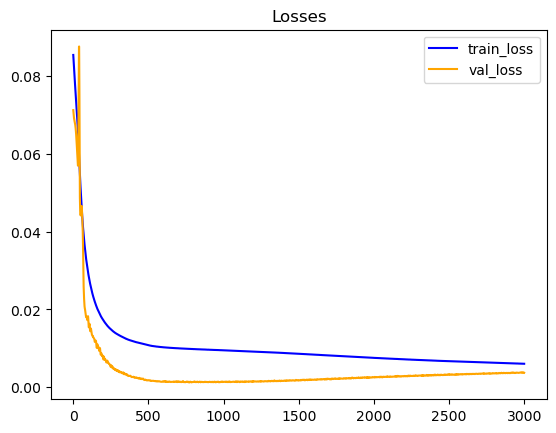

In [97]:
plt.plot(train_losses, color='blue', label='train_loss')
plt.plot(val_losses, color='orange', label='val_loss')
plt.title('Losses')

plt.legend()
plt.show()

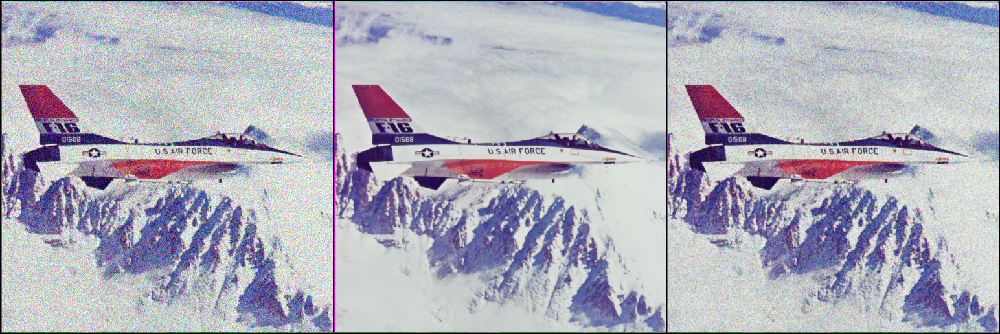

In [98]:
unet.eval()
restored_img = unet(z)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img],dim=0),nrow=3,normalize=True))

As we can see from resulting image,it is almost like original one, but with some noise. From graph of validation loss we can conclude, that our algorithm overfites after some number of iterations and goes up.

## Early stopping (3 pts)

One solution to prevent the recurrence of past issues is by terminating the training process at an optimal point. However, determining the ideal number of iterations can be a challenging task. Therefore, your objective is to:

1. Find out appropriate number of iterations (the best reconstruction of original image)
2. Suggest stopping criteria for the denoising task in real case (when you do not know ground truth) (**Hint: use Total Variation metric to measure the amount of noise in the image**)
3. Compare the result of your strategy with found number of iterations in the first step

In [99]:
def find_best_iter(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01):
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    best_iter = 0
    best_val_loss = 10000
    for step in tqdm(range(iters)):
        model.train()
        out = model(z+torch.normal(0, reg_noise, z.size()).to(device))
        loss_train = criterion(out, corrupted_img)
        
        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()
        
        with torch.no_grad():
            model.eval()
            out = model(z)
            loss_val = criterion(out, orig_img)
            
        if loss_val < best_val_loss:
            best_val_loss = loss_val.item()
            best_iter = step + 1
        
    return best_iter 

In [100]:
unet1 = Unet(32, 3, 16).to(device)
z1 = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)
best_iter = find_best_iter(unet1, z1, corrupted_img, img, 3000)

100%|██████████| 3000/3000 [08:08<00:00,  6.15it/s]


In [101]:
print('appropriate number of iters: ', best_iter)

appropriate number of iters:  1091


In [116]:
def optimization_modified(model,z,noised_img,orig_img,iters,criterion=torch.nn.MSELoss(), reg_noise=0.01):
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    tv = TV().to(device)
    train_losses = []
    val_losses = []
    min_val_tv = 10000
    for step in tqdm(range(iters)):
        model.train()
        out = model(z+torch.normal(0, reg_noise, z.size()).to(device))
        loss_train = criterion(out, noised_img)
        
        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()
        
        with torch.no_grad():
            model.eval()
            out = model(z)
            loss_val = criterion(out, orig_img)
        
        train_losses.append(loss_train.item())
        val_losses.append(loss_val.item())
        
        tv_curr = tv(out)
        if tv_curr < min_val_tv:
            min_val_tv = tv_curr.item()
            
        if step > iters // 10:
            tv_deviation = tv_curr.item() / min_val_tv - 1
            if tv_deviation > 0.3:
                break
    
    return train_losses, val_losses

In [117]:
unet2 = Unet(32, 3, 16).to(device)
z2 = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)
train_losses2, val_losses2 = optimization_modified(unet2, z2, corrupted_img, img, 3000)

 10%|█         | 301/3000 [00:48<07:13,  6.22it/s]


In [112]:
print(f'Best number of iters: appropriate number - {best_iter}, my strategy - {len(val_losses2)}')

Best number of iters: appropriate number - 1091, my strategy - 302


In [113]:
unet1 = Unet(32, 3, 16).to(device)
z1 = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)
train_losses1, val_losses1 = optimization(unet1, z1, corrupted_img, img, best_iter)

100%|██████████| 1091/1091 [02:55<00:00,  6.22it/s]


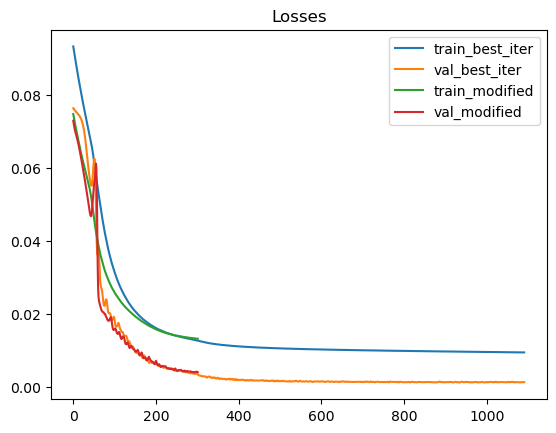

In [114]:
plt.plot(train_losses1, label='train_best_iter')
plt.plot(val_losses1, label='val_best_iter')
plt.plot(train_losses2, label='train_modified')
plt.plot(val_losses2, label='val_modified')
plt.title('Losses')

plt.legend()
plt.show()

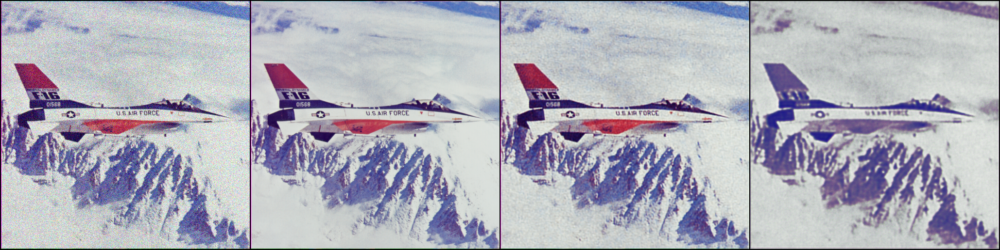

In [115]:
unet1.eval()
unet2.eval()
restored_img1 = unet1(z1)
restored_img2 = unet2(z2)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img1,restored_img2],dim=0),nrow=4,normalize=True))

As we can see, with best number of iterations I got better result, then with early stopping criteria.

## Stochastic gradient Langevin dynamics (SGLD) optimization 

Another way to solve the problem of increasing the loss function over iterations is to adopt optimization procedure. In the explanations above we have already mentioned that the goal of deep prior is to evaluate the integral:

$$p(y|\hat{y}) = \int p(y|z,\theta,\hat{y})p(\theta|\hat{y})p(z)dzd\theta$$

Instead of directly solving the integral, we can use the Markov chain Monte Carlo (MCMC) method to estimate the posterior. This involves generating a sequence of correlated samples from the target distribution, which can converge to the true posterior during iterations. However, the MCMC approach can be slow and inefficient, and hence, using gradient-based optimization with noise can be a more effective solution. This involves minimizing the objective function and introducing noise to the gradient updates:

$$\theta_{i+1} = \theta_{i} + \mathrm{lr}\cdot\Delta_{i}^{\mathrm{standard}} + s\cdot\mathrm{lr}\cdot\epsilon$$

where $\Delta_{i}^{\mathrm{standard}}$ standard optimization update, $\mathrm{lr}$ - learning rate, $\epsilon \sim N(0,1)$, $s$ - strength of added noise.

More details of how and why it works described in [paper](https://arxiv.org/pdf/1904.07457.pdf)

### Implement SGLD (5 pts)

1. Take the previous implementation of the optimization procedure and adjust it to add noise to the model parameters after each iteration, but **only for convolutional layers**.
2. Set the strength of added noise to 4.
3. Plot the training convergence with the loss computed for generated and corrupted images.
4. Plot the training convergence with the loss computed for generated and original images.
5. Analyze and explain the results in comparison to the Early Stopping approach.
6. Try different values for the strength of added noise $s$ and comment the results.

In [118]:
def SGLD(model,z,corrupted_img,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.01, strength=4):
    lr = 1e-4
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    train_losses = []
    val_losses = []
    for step in tqdm(range(iters)):
        model.train()
        out = model(z+torch.normal(0, reg_noise, z.size()).to(device))
        loss_train = criterion(out, corrupted_img)
        
        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()
        
        with torch.no_grad():
            prev_conv = False
            for param in model.parameters():
                if len(param) != 4:
                    if prev_conv:
                        param += strength * lr * torch.normal(0, 1, param.size()).to(device)
                    prev_conv = False
                    
                else:
                    prev_conv = True
                    param += strength * lr * torch.normal(0, 1, param.size()).to(device)
            
            model.eval()
            out = model(z)
            loss_val = criterion(out, orig_img)
        
        train_losses.append(loss_train.item())
        val_losses.append(loss_val.item())
    
    return train_losses, val_losses

In [119]:
unet_sgld = Unet(32, 3, 16).to(device)
z_sgld = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)
train_losses_sgld, val_losses_sgld = SGLD(unet_sgld, z_sgld, corrupted_img, img, 1000)

100%|██████████| 1000/1000 [02:40<00:00,  6.21it/s]


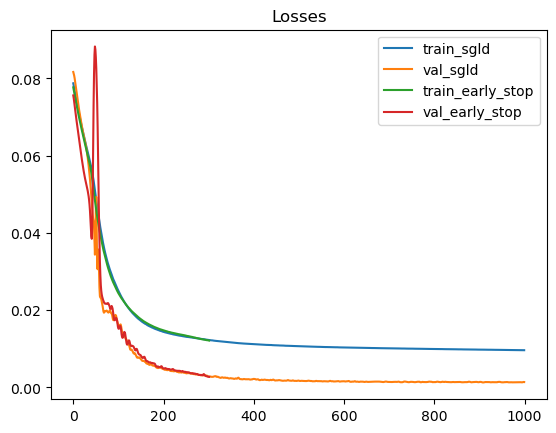

In [120]:
plt.plot(train_losses_sgld, label='train_sgld')
plt.plot(val_losses_sgld, label='val_sgld')
plt.plot(train_losses2, label='train_early_stop')
plt.plot(val_losses2, label='val_early_stop')
plt.title('Losses')

plt.legend()
plt.show()

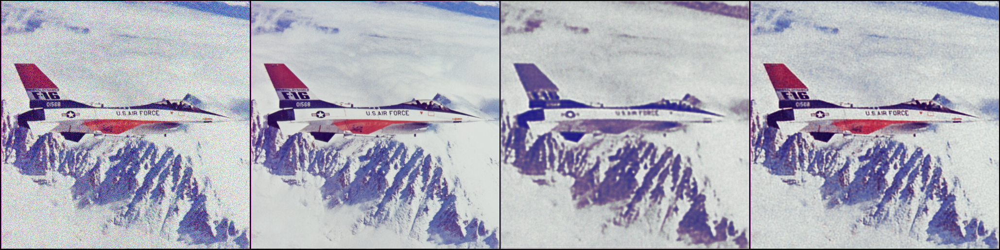

In [121]:
unet_sgld.eval()
restored_img_sgld = unet_sgld(z_sgld)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img2,restored_img_sgld],dim=0),nrow=4,normalize=True))

As we can see, SGLD approach much better then early stop. Adding random noise to convolutions  helpes to stabilize training, which we can see from graph of losses - SGLD validation loss much smoother.

## strength grid search

In [128]:
unet_sgld1 = Unet(32, 3, 16).to(device)
z_sgld1 = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)
train_losses_sgld1, val_losses_sgld1 = SGLD(unet_sgld1, z_sgld1, corrupted_img, img, 1000, strength=2)

100%|██████████| 1000/1000 [02:41<00:00,  6.18it/s]


In [129]:
unet_sgld2 = Unet(32, 3, 16).to(device)
z_sgld2 = torch.normal(mean=0, std=0.1, size=(1, 32, img.size(2), img.size(3)), requires_grad=True).to(device)
train_losses_sgld2, val_losses_sgld2 = SGLD(unet_sgld2, z_sgld2, corrupted_img, img, 1000, strength=6)

100%|██████████| 1000/1000 [02:41<00:00,  6.20it/s]


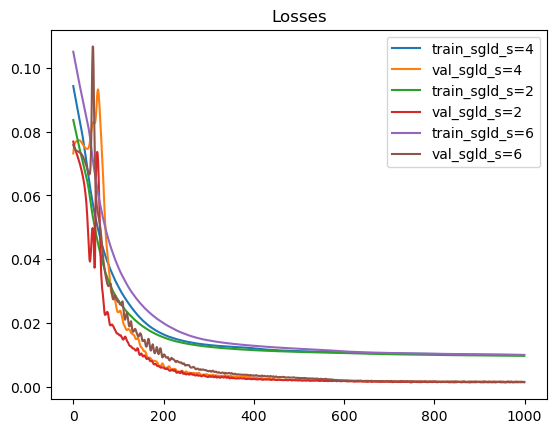

In [130]:
plt.plot(train_losses_sgld, label='train_sgld_s=4')
plt.plot(val_losses_sgld, label='val_sgld_s=4')
plt.plot(train_losses_sgld1, label='train_sgld_s=2')
plt.plot(val_losses_sgld1, label='val_sgld_s=2')
plt.plot(train_losses_sgld2, label='train_sgld_s=6')
plt.plot(val_losses_sgld2, label='val_sgld_s=6')
plt.title('Losses')

plt.legend()
plt.show()

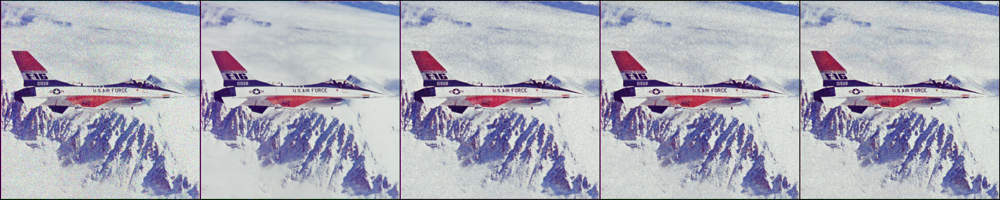

In [131]:
unet_sgld1.eval()
unet_sgld2.eval()
restored_img_sgld1 = unet_sgld1(z_sgld1)
restored_img_sgld2 = unet_sgld2(z_sgld2)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img_sgld,restored_img_sgld1,restored_img_sgld2],dim=0),nrow=5,normalize=True))

Easy to see, that results are almost the same. But for me, with lowest s=2 image a bit brighter. From graphs we can see, that lower s helpes to converge fuster - graphs decrease in less number of iterations. 

## Inpainting

Deep Image Prior is a versatile tool that can be utilized in solving an important task such as image inpainting. In this task, the challenge lies in the inability to obtain values for the pixels that are damaged and defined by the mask. Thus, during the training process, it is essential to apply the mask to the generated image as these values are unavailable for this particular task. Furthermore, in order to effectively address this issue, you will try a more complex model called AttentionUNet. This model is similar to the UNet model in terms of structure but with the inclusion of attention blocks in the decoder part. 

### Attention block (10 pts)

For AttentionUNet implementation you only need to implement Attention layer. Attention should scale hidden output of encoder block which is also an input for the corresponding decoder block in order to draw more "attention" to particular image parts. Below we have placed the pipeline which you should implement:

**Input:** $skip$ of size [batch,skip_channels,H_skip,W_skip], $x$ of size [batch,x_channels,H_x,W_x]

**Output:** $skip^*$ of size [batch,skip_channels,H_skip,W_skip]

1. Apply 2d convolution with kernel size $2$ to $skip$ to make it of size [batch,skip_channels,H_x,W_x] (recall that 2H_x = H_skip, 2W_x = W_skip)
2. Apply 2d convolution with kernel size $1$ to $x$ to make it of size [batch,skip_channels,H_x,W_x]
3. Sum the outputs of previous two steps and apply ReLU over it.
4. Apply 2d convolution to previous output to reduce channel dimension to 1. So the output should have size equal [batch,1,H_x,W_x]
5. Apply Sigmoid to the previous output to get attention itself
6. Apply attention to the input $skip$ (original block input **NOT** the output of the first step) by simply multipling $skip$ by attention element-wise.

In [15]:
class Attention(torch.nn.Module):
    def __init__(self,skip_channels, x_channels):
        super().__init__()
        self.makeQ = torch.nn.Conv2d(skip_channels, skip_channels, kernel_size=2, stride=2)
        self.makeK = torch.nn.Conv2d(x_channels, skip_channels, kernel_size=1)
        self.makeQK = torch.nn.ReLU()
        self.makeQK2 = torch.nn.Conv2d(skip_channels, 1, kernel_size=1)
        self.attention = torch.nn.Sigmoid()
        self.upsample = torch.nn.ConvTranspose2d(1,1,kernel_size=2,stride=2)
        
    def forward(self,skip,x):
        Q = self.makeQ(skip)
        K = self.makeK(x)
        QK = self.makeQK(Q + K)
        QK = self.makeQK2(QK)
        attention = self.attention(QK)
        attention = self.upsample(attention)
        return attention * skip

In [16]:
class Decoder_Block_With_Attention(torch.nn.Module):
    def __init__(self,inp_channels,out_channels):
        super().__init__()
        self.upsample = torch.nn.ConvTranspose2d(inp_channels,out_channels,kernel_size=2,stride=2)
        self.model = torch.nn.Sequential(
            torch.nn.Conv2d(inp_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels,out_channels,kernel_size=3,padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
        )
        self.attention = Attention(out_channels,inp_channels)
    def forward(self,x,enc_x):
        enc_x = self.attention(enc_x,x)
        x = self.upsample(x)
        x = torch.cat([x,enc_x],dim=1)
        return self.model(x)


class AttentionUnet(torch.nn.Module):
    def __init__(self,inc,outc,hidden_size=16):
        super().__init__()
        self.Encoder = torch.nn.ModuleList([
            Encoder_Block(inc,hidden_size),
            Encoder_Block(hidden_size,hidden_size*2),
            Encoder_Block(hidden_size*2,hidden_size*4),
            Encoder_Block(hidden_size*4,hidden_size*8),
        ])
        self.bottleneck = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size*8,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU(),
            torch.nn.Conv2d(hidden_size*16,hidden_size*16,kernel_size=1),
            torch.nn.BatchNorm2d(hidden_size*16),
            torch.nn.ReLU()
        )
        self.Decoder = torch.nn.ModuleList([
            Decoder_Block_With_Attention(hidden_size*16,hidden_size*8),
            Decoder_Block_With_Attention(hidden_size*8,hidden_size*4),
            Decoder_Block_With_Attention(hidden_size*4,hidden_size*2),
            Decoder_Block_With_Attention(hidden_size*2,hidden_size*1),
        ])
        self.last_layer = torch.nn.Sequential(
            torch.nn.Conv2d(hidden_size,outc,kernel_size=3,padding="same"),
            torch.nn.Sigmoid()
        )
    def forward(self,x):
        enc_xs = []
        for module in self.Encoder:
            x, enc_x= module(x)
            enc_xs.append(enc_x)

        enc_xs = enc_xs[::-1]
        x = self.bottleneck(x)

        for i,module in enumerate(self.Decoder):
            x = module(x,enc_xs[i])
        return self.last_layer(x)

In [17]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
])

In [18]:
img = transform(Image.open("./data/inpainting/library.png"))[None].to(device)
img_mask = transform(Image.open("./data/inpainting/library_mask.png"))[None].to(device)
corrupted_img = img * img_mask

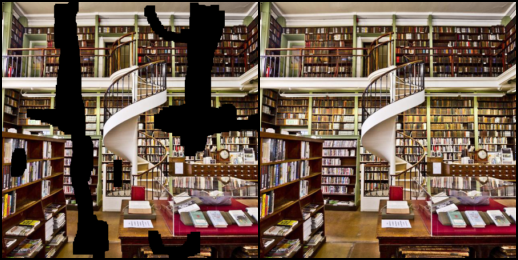

In [19]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img],dim=0),nrow=2,normalize=True))

### Modify SGLD optimization (6 pts):
1. Take the code for SGLD and update loss calculation by applying mask to generated image (take $s$ = 4, lr = $4 \cdot 10^{-4}$, reg_noise = $0.2$, iters=$2000$)
2. Run the code and evaluate how well model fitted to known pixels and restore the missed one
3. Run the same code with standard UNet model and compare results with AttentionUNet. What conclusion can you make?


**Bonus task (4 pts)** Try to find optimal hyper parameters (strength of added noise $s$, learning rate, reg_noise, number of iterations)

In [26]:
def optimization_inpainting(model,z,corrupted_img,mask,orig_img,iters,criterion=torch.nn.MSELoss(),reg_noise=0.03, strength=4):
    lr = 4e-4
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    train_losses = []
    val_losses = []
    for step in tqdm(range(iters)):
        model.train()
        out = model(z+torch.normal(0, reg_noise, z.size()).to(device))
        loss_train = criterion(out*mask, corrupted_img)
        
        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()
        
        with torch.no_grad():
            prev_conv = False
            for param in model.parameters():
                if len(param) != 4:
                    if prev_conv:
                        param += strength * lr * torch.normal(0, 1, param.size()).to(device)
                    prev_conv = False
                    
                else:
                    prev_conv = True
                    param += strength * lr * torch.normal(0, 1, param.size()).to(device)
            
            model.eval()
            out = model(z)
            loss_val = criterion(out*mask, orig_img)
        
        train_losses.append(loss_train.item())
        val_losses.append(loss_val.item())
    
    return train_losses, val_losses

In [21]:
nc = 2
model_without_attention = Unet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

/opt/conda/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [27]:
train_losses_inp, val_losses_inp = optimization_inpainting(model_without_attention, z, corrupted_img, img_mask, img, 2000, reg_noise=0.2, strength=4)

100%|██████████| 2000/2000 [01:17<00:00, 25.71it/s]


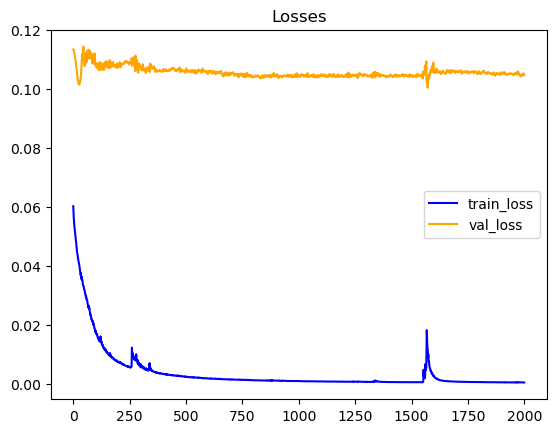

In [28]:
plt.plot(train_losses_inp, color='blue', label='train_loss')
plt.plot(val_losses_inp, color='orange', label='val_loss')
plt.title('Losses without attention')

plt.legend()
plt.show()

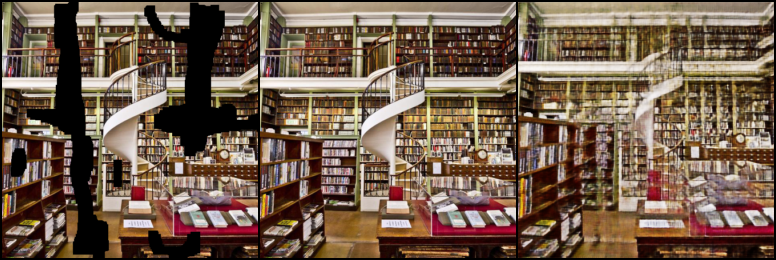

In [29]:
model_without_attention.eval()
restored_img = model_without_attention(z)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img],dim=0),nrow=3,normalize=True))

In [30]:
nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)

In [31]:
train_losses_inp, val_losses_inp = optimization_inpainting(model_with_attention, z, corrupted_img, img_mask, img, 2000, reg_noise=0.2, strength=4)

100%|██████████| 2000/2000 [01:22<00:00, 24.21it/s]


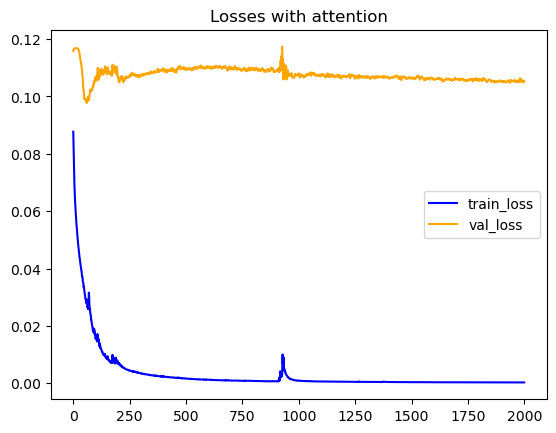

In [32]:
plt.plot(train_losses_inp, color='blue', label='train_loss')
plt.plot(val_losses_inp, color='orange', label='val_loss')
plt.title('Losses with attention')

plt.legend()
plt.show()

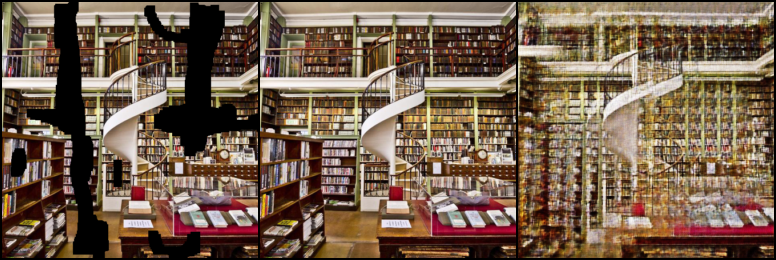

In [33]:
model_with_attention.eval()
restored_img_att = model_with_attention(z)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img_att],dim=0),nrow=3,normalize=True))

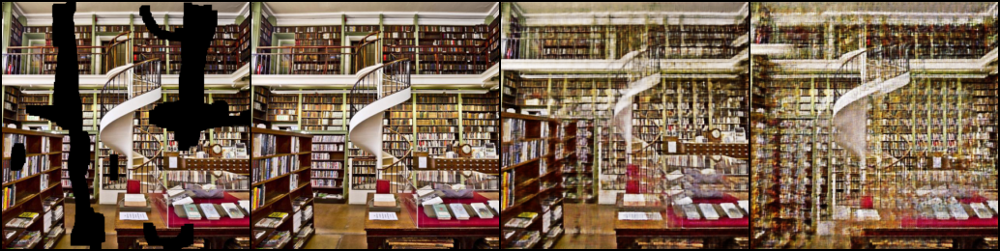

In [34]:
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img,restored_img_att],dim=0),nrow=4,normalize=True))

(for bonus task) Here you can see best hyperparameters that I found. Number of iterations are about 2000, reg_noise=0.03 and strength=4. Increasing reg_noise slowes down convergence and increasing strength make image not so detailed. However, some deviation from 0.03 of reg_noise not change dramatically result. Grid search was done mannually, looking at resulted images.

In [77]:
nc = 2
model_with_attention = AttentionUnet(nc,3,hidden_size=16).to(device)
z = torch.cat(torch.meshgrid(torch.arange(img.size(2))/img.size(2),torch.arange(img.size(3))/img.size(3))).reshape(1,2,img.size(2),img.size(3)).to(device)
train_losses, val_losses = optimization_inpainting(model_with_attention, z, corrupted_img, img_mask, img, 2000, reg_noise=0.03, strength=4)

100%|██████████| 2000/2000 [01:20<00:00, 24.95it/s]


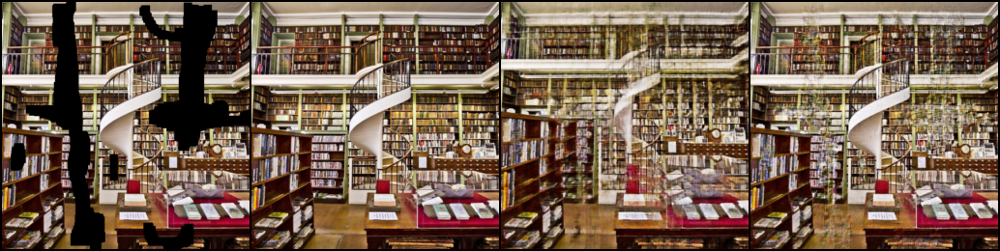

In [80]:
model_with_attention.eval()
restored_img_att = model_with_attention(z)
transforms.ToPILImage()(torchvision.utils.make_grid(torch.cat([corrupted_img,img,restored_img, restored_img_att],dim=0),nrow=4,normalize=True))

## Problem 3. Natural language generation (35 pts)

This problem requires uploading two csv files along with the solution notebook. Please compress these three files in zip archive and upload it in Canvas. 

Natural language generation (NLG) is a well-known research problem concerned with generating textual descriptions of structured data, such as tables, as output. Compared to machine translation, where the goal is to completely convert an input sentence into another language, NLG requires overcoming two different challenges: deciding what to say, by selecting a relevant subset of the input data to describe, and deciding how to say it, by generating text that flows and reads naturally. 

In this task you will need to generate table descriptions and titles for the dataset that can be downloaded from the [link](https://box.skoltech.ru/index.php/s/DRfJFNUJMgmLxOU). Your inference pipeline should receive `.csv` and output 2 strings: table description `text` and table title `title`.

As the solution to this task you shoud complete `submission.csv` and `submission_reranking.csv` files as below and report the link on your finetuned checkpoints.

In [1]:
!pip install gdown -q
!pip install transformers -q
!pip install evaluate -q
!pip install sacrebleu -q
!pip install rouge_score -q
!pip install -U nltk -q
!pip install bert_score -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
preprocessing 0.1.13 requires nltk==3.2.4, but you have nltk 3.8.1 which is incompatible.


In [2]:
!gdown 1QP6f9UiojI6Bie2Z2hRtIGY_Um8rTBmY
!unzip -qq dataset_nlg_v1.zip

Downloading...
From (uriginal): https://drive.google.com/uc?id=1QP6f9UiojI6Bie2Z2hRtIGY_Um8rTBmY
From (redirected): https://drive.google.com/uc?id=1QP6f9UiojI6Bie2Z2hRtIGY_Um8rTBmY&confirm=t&uuid=ebcb6dd5-fb6c-4e33-af94-10ee15f7a317
To: /kaggle/working/dataset_nlg_v1.zip
100%|███████████████████████████████████████| 18.4M/18.4M [00:00<00:00, 158MB/s]


In [3]:
import numpy as np
import torch
from tqdm import tqdm
import gc
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset as torchDataset
from torch.utils.data import DataLoader
from datasets import Dataset
from transformers import T5Tokenizer, T5ForConditionalGeneration, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer
from evaluate import load
import random

In [4]:
import pandas as pd

data = pd.read_csv('./dataset_nlg_v1/train.csv', index_col=0)
data.head(5)

,text,title
871923758931292416,This statistic presents the global revenue of ...,Omnicom Group 's revenue from 2006 to 2019 ( i...
12713542298181105208,This statistic shows the number of hotel and s...,Number of hotel and similar accommodation esta...
5796511258704617257,"In 2019 , just 2.5 percent of all private wage...",Unemployment rate in the U.S. broadcasting ind...
14629703118053421010,This statistic displays the benefits of using ...,If a â€œconnected deviceâ€ ? had the following...
14801098692472737046,The statistic shows global gross domestic prod...,Global gross domestic product ( GDP ) at curre...


In [5]:
sample = pd.read_csv('./dataset_nlg_v1/data/14801098692472737046.csv', index_col=0)
sample

,Year,GDP in billion international dollars
0,2021*,149128.01
1,2020*,138352.38
2,2019,142005.65
3,2018,135762.14
4,2017,128046.90
5,2016,121089.82
6,2015,115998.69
7,2014,111065.56
8,2013,105367.70
9,2012,100154.94


In [6]:
submission = pd.read_csv('./dataset_nlg_v1/submission.csv', index_col=0)
submission.head(5)

,text,title
223685202396506,NaN,NaN
223685202396505,NaN,NaN
223685202396504,NaN,NaN
223685202396503,NaN,NaN
223685202396502,NaN,NaN


- (**5 pts**) Propose and implement at least 2 variants of the input data preprocessing from tables to string data.
- (**5 pts**) Fine-tune [T5](https://huggingface.co/docs/transformers/model_doc/t5) as a baseline using `t5-base` checkpoint ([paper](https://arxiv.org/pdf/1910.10683.pdf)). In order to handle 2 types of output, test usage of prefixes for T5 model.
- (**5 pts**) Propose and implement at least 2 variants of data augmentation, retune T5 and compare performance.
- (**5 pts**) Add domain adoptation via additional Masked language modeling loss (MLM, [paper, section 3.1, Task #1](https://arxiv.org/pdf/1810.04805.pdf)) loss term for encoder, provide hyperparameter search for the regularization parameter $\lambda$, use BERTScore as objective, compare performance:
$$L(x, y) = -LogLikelihood(x, y) + \lambda L_{MLM}(x_{masked}, x)$$


The following metrics should be reported:
- [SacreBLEU](https://github.com/mjpost/sacrebleu)
- [ROUGEL](https://github.com/google-research/google-research/tree/master/rouge)
- [METEOR](https://www.nltk.org/_modules/nltk/translate/meteor_score.html)
- [BERTScore](https://github.com/Tiiiger/bert_score) using `bert-base-uncased` checkpoint and 9th layer output

Using the best checkpoint from above prepare submission file `submission.csv`, where index is a table caption from the `data` folder, and report the link on your finetuned checkpoint.

In [7]:
def table_to_string1(table): # row-wise
    string = ' | '
    string = string.join(table.columns) + '\n'
    for i in table.astype(str).values:
        string += ' | '.join(i) + '\n'
    
    return string
    
def table_to_string2(table): #columns-wise
    string = ''
    for col in table.columns:
        string += col + ': '
        string += ', '.join(table[col].astype(str))
        string += '\n'
    
    return string

In [8]:
text_prefix = 'generate text from: '
title_prefix = 'generate title from: '

def preprocess_train(table_to_string, data):
    texts = []
    sources = []
    for i, (text, title) in tqdm(data.iterrows(), total=data.shape[0]):
        texts.append(text)
        texts.append(title)
        sample = pd.read_csv(f'./dataset_nlg_v1/data/{i}.csv', index_col=0)
        string = table_to_string(sample)
        sources.append(text_prefix + string)
        sources.append(title_prefix + string)
    data_df = {'text': texts, 'source': sources}
    return pd.DataFrame(data_df)

def preprocess_test(table_to_string, data):
    texts = []
    titles = []
    sources_texts = []
    sources_titles = []
    for i, (text, title) in tqdm(data.iterrows(), total=data.shape[0]):
        texts.append(text)
        titles.append(title)
        sample = pd.read_csv(f'./dataset_nlg_v1/data/{i}.csv', index_col=0)
        string = table_to_string(sample)
        sources_texts.append(text_prefix + string)
        sources_titles.append(title_prefix + string)
    text_df = {'text': texts, 'source': sources_texts}
    title_df = {'title': titles, 'source': sources_titles}
    return pd.DataFrame(text_df), pd.DataFrame(title_df)

In [9]:
raw_data = preprocess_train(table_to_string1, data)
raw_text_test, raw_title_test = preprocess_test(table_to_string1, submission)

100%|██████████| 10864/10864 [00:19<00:00, 546.82it/s]


In [10]:
tokenizer = T5Tokenizer.from_pretrained("t5-base")

/opt/conda/lib/python3.7/site-packages/transformers/models/t5/tokenization_t5.py:173: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


In [11]:
max_source_length = 256
max_target_length = 128

data_config = {'add_special_tokens':True,
                'max_length': max_source_length,
                'truncation':True,
                'return_token_type_ids':False,
                'padding':'max_length',
                'return_attention_mask':True,
                'return_tensors':'pt',
                'verbose':False}

target_config = {'add_special_tokens':True,
                'max_length': max_target_length,
                'truncation':True,
                'return_token_type_ids':False,
                'padding':'max_length',
                'return_attention_mask':True,
                'return_tensors':'pt',
                'verbose':False}

In [12]:
def random_deletion(sentence, p=0.3):
    """Randomly delete words from the sentence with a given probability"""
    words = sentence.split()
    prefix = words[1]
    words = words[3:]
    new_sentence = [word for word in words if random.uniform(0, 1) > p]
    return f'generate {prefix} from:' + ' '.join(new_sentence)

def random_swap(sentence, n=2):
    """Randomly swap two adjacent words in the sentence"""
    words = sentence.split()
    new_sentence = sentence.split()
    prefix = new_sentence[1]
    new_sentence = new_sentence[3:]
    for i in range(n):
        if len(words) > 1:
            idx_1, idx_2 = random.sample(range(len(words)-1), 2)
            new_sentence[idx_1], new_sentence[idx_2] = new_sentence[idx_2], new_sentence[idx_1]
    return f'generate {prefix} from:' + ' '.join(new_sentence)

def apply_augmentation(sentence_tokenized, attention_mask, p=0.125):
    apply_deletion = np.random.binomial(1, p, size=1)
    apply_swap = np.random.binomial(1, p, size=1)
    
    if not (apply_deletion[0] or apply_swap[0]):
        return sentence_tokenized, attention_mask
        
    sentence = tokenizer.decode(sentence_tokenized, skip_special_tokens=True)

    if apply_deletion[0]:
        sentence = random_deletion(sentence)
    if apply_swap[0]:
        sentence = random_deletion(sentence)
    sentence = tokenizer(sentence, **data_config)

    return sentence.input_ids.squeeze(), sentence.attention_mask.squeeze()

class T5Dataset(torchDataset):
    def __init__(self, data, tokenizer, data_config, target_config, do_augmentation=False, is_test=False):
        super().__init__()
        self.source_tokens = tokenizer(data.source.to_list(), **data_config)
        self.target_tokens = tokenizer(data.text.to_list(), **target_config)
        self.length = len(self.source_tokens['input_ids'])
        self.do_augmentation = do_augmentation

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        input_ids = self.source_tokens['input_ids'][index]
        attention_mask = self.source_tokens['attention_mask'][index]
        label = self.target_tokens['input_ids'][index]
        if self.do_augmentation:
            input_ids, attention_mask = apply_augmentation(input_ids, attention_mask)
        
        return {
          'input_ids':input_ids,
          'attention_mask':attention_mask,
          'labels': label
        }

In [14]:
raw_data_small = raw_data.sample(frac=1).iloc[:len(raw_data) // 10]
raw_data_small.head()

,text,source
28774,This statistic illustrates the ranking of most...,generate text from: name | Number of newly reg...
40222,This statistic gives information on the mobile...,generate text from: Response | Share of popula...
42478,This statistic shows the total population of M...,generate text from: Year | Inhabitants in mill...
8907,Risk index score of money laundering and terro...,generate title from: Year | Risk index score\n...
43416,This graph shows the percentage of high-techno...,generate text from: Year | Percentage of high-...


In [15]:
batch_size = 8

train, val = train_test_split(raw_data_small, test_size=0.1)
train_dataset = T5Dataset(train, tokenizer, data_config, target_config)
val_dataset = T5Dataset(val, tokenizer, data_config, target_config)

In [16]:
bleu_scorer = load("sacrebleu")
rouge_scorer = load('rouge')
meteor_scorer = load('meteor')
bert_scorer = load("bertscore")


def compute_metrics(p):
    predictions, labels = p
    decoded_preds = tokenizer.batch_decode(predictions, skip_special_tokens=True)
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)

    bleuscore = bleu_scorer.compute(predictions=decoded_preds, references=decoded_labels)['score']
    rougescore = rouge_scorer.compute(predictions=decoded_preds, references=decoded_labels)['rougeL']
    meteorscore = meteor_scorer.compute(predictions=decoded_preds, references=decoded_labels)['meteor']
    bertscore = bert_scorer.compute(predictions=decoded_preds, references=decoded_labels, lang="en", model_type="bert-base-uncased", num_layers=9, verbose=False)
    
    return {
        "eval_Sacrebleu": bleuscore,
        "eval_Rougel": rougescore,
        "eval_Meteor": meteorscore,
        "eval_Precision": np.mean(bertscore["precision"]),
        "eval_Recall": np.mean(bertscore["recall"]),
        "eval_F1": np.mean(bertscore['f1'])
    }

[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


# Fine-tuning model

In [17]:
num_epochs = 1

args = Seq2SeqTrainingArguments(
    output_dir="output",
    evaluation_strategy = "epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=num_epochs,
    weight_decay=0.01,
    save_strategy='no',
    report_to='none',
    logging_strategy='epoch',
    metric_for_best_model='Rougel',
    skip_memory_metrics = False,
    dataloader_num_workers = 2,
    predict_with_generate=True
)

In [22]:
model = T5ForConditionalGeneration.from_pretrained("t5-base")
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

trainer = Seq2SeqTrainer(
    model,
    args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

In [23]:
trainer.train()
gc.collect()
torch.cuda.empty_cache()

/opt/conda/lib/python3.7/site-packages/transformers/optimization.py:395: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,


Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,1.074300,0.758568,6.290175,0.330830,0.280313,0.642196,0.551843,0.588509


# Augmentations

In [24]:
train_dataset = T5Dataset(train, tokenizer, data_config, target_config, do_augmentation=True)
val_dataset = T5Dataset(val, tokenizer, data_config, target_config)

In [25]:
model = T5ForConditionalGeneration.from_pretrained("t5-base")
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

trainer = Seq2SeqTrainer(
    model,
    args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    data_collator=data_collator,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

In [26]:
trainer.train()
gc.collect()
torch.cuda.empty_cache()

Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,1.100100,0.761464,6.372711,0.326381,0.282411,0.638123,0.550658,0.585814


# MLM Loss

In [18]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def apply_mask(inputs):
    labels = inputs.clone()
    probability_matrix = torch.full(labels.shape, 0.15)

    special_tokens_mask = [
        tokenizer.get_special_tokens_mask(val, already_has_special_tokens=True) for val in labels.tolist()
    ]
    special_tokens_mask = torch.tensor(special_tokens_mask, dtype=torch.bool)


    probability_matrix.masked_fill_(special_tokens_mask, value=0.0)
    masked_indices = torch.bernoulli(probability_matrix).bool()
    labels[~masked_indices] = -100

    indices_replaced = torch.bernoulli(torch.full(labels.shape, 0.8)).bool() & masked_indices
    inputs[indices_replaced] = tokenizer.convert_tokens_to_ids('<extra_id_0>')

    indices_random = torch.bernoulli(torch.full(labels.shape, 0.5)).bool() & masked_indices & ~indices_replaced
    random_words = torch.randint(len(tokenizer), labels.shape, dtype=torch.long)
    inputs[indices_random] = random_words[indices_random].to(device)
    return inputs, labels

class T5MLM(T5ForConditionalGeneration):
    def __init__(self, config):
        super().__init__(config)
        self.encoder_head = torch.nn.Linear(in_features=768, out_features=32128, bias=False)

In [19]:
class T5Trainer(Seq2SeqTrainer):
    def __init__(self,
        model = None,
        args = None,
        data_collator = None,
        train_dataset = None,
        eval_dataset = None,
        tokenizer = None,
        model_init = None,
        compute_metrics = None,
        callbacks = None,
        optimizers = (None, None),
        reg_param=0.0):
        
        super().__init__(model, args, data_collator, train_dataset,
                       eval_dataset, tokenizer, model_init, 
                       compute_metrics, callbacks, optimizers)
        
        self.reg_param = reg_param
    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.get("labels")
        
        x_masked, x = apply_mask(inputs['input_ids'].clone())
        loss_log = model(**inputs).loss
        x_pred = model.encoder_head(model.encoder(x_masked)[0])
        
        loss_fct = torch.nn.CrossEntropyLoss()
        loss_mlm = loss_fct(x_pred.transpose(1, 2), x)
        loss = loss_log + self.reg_param * loss_mlm
        return (loss, model(**inputs)) if return_outputs else loss

In [34]:
train_dataset = T5Dataset(train, tokenizer, data_config, target_config)
val_dataset = T5Dataset(val, tokenizer, data_config, target_config)

In [36]:
for reg_param_ in [0.05, 0.1, 0.15]:
    model = T5MLM.from_pretrained("t5-base")
    data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

    trainer = T5Trainer(
        model,
        args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        data_collator=data_collator,
        tokenizer=tokenizer,
        compute_metrics=compute_metrics,
        reg_param=reg_param_
    )
    
    trainer.train()
    gc.collect()
    torch.cuda.empty_cache()

Some weights of T5MLM were not initialized from the model checkpoint at t5-base and are newly initialized: ['encoder_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,1.520600,0.757636,6.490615,0.329176,0.284084,0.644218,0.554660,0.590932


Some weights of T5MLM were not initialized from the model checkpoint at t5-base and are newly initialized: ['encoder_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,1.918700,0.758716,6.467667,0.327153,0.279720,0.640723,0.551962,0.587826


Some weights of T5MLM were not initialized from the model checkpoint at t5-base and are newly initialized: ['encoder_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Sacrebleu,Rougel,Meteor,Precision,Recall,F1
1,2.309300,0.761642,6.279205,0.321584,0.273861,0.635153,0.547967,0.583067


# Prepare submission with best parameters (mlm loss with lambda=0.05)

In [20]:
train_dataset = T5Dataset(raw_data, tokenizer, data_config, target_config)

In [21]:
args = Seq2SeqTrainingArguments(
    output_dir="output",
    evaluation_strategy = "no",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=num_epochs,
    weight_decay=0.01,
    save_strategy='no',
    report_to='none',
    logging_strategy='no',
    skip_memory_metrics = False,
    dataloader_num_workers = 2,
    predict_with_generate=True
)

In [22]:
model = T5MLM.from_pretrained("t5-base")
data_collator = DataCollatorForSeq2Seq(tokenizer, model=model)

trainer = T5Trainer(
    model,
    args,
    train_dataset=train_dataset,
    data_collator=data_collator,
    tokenizer=tokenizer,
    reg_param=0.05
)

Some weights of T5MLM were not initialized from the model checkpoint at t5-base and are newly initialized: ['encoder_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [23]:
trainer.train()
gc.collect()
torch.cuda.empty_cache()

/opt/conda/lib/python3.7/site-packages/transformers/optimization.py:395: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,


Step,Training Loss


In [24]:
text_dataset = Dataset.from_dict(tokenizer(raw_text_test.source.to_list(), **data_config))
text_preds_tokenized = trainer.predict(text_dataset)
text_preds = []
for i in tqdm(range(0, len(text_preds_tokenized.predictions), 8)):
    text_preds += tokenizer.batch_decode(text_preds_tokenized.predictions[i:i+8], skip_special_tokens=True)
text_preds[:5]

100%|██████████| 1358/1358 [02:15<00:00, 10.00it/s]


['This statistic shows the number of employees of the company from 2009 to 2019. In 2019',
 'This statistic shows the total production of sulphur dioxide ( SO2 ) in India',
 'This statistic shows the top five car manufacturers in the United States in 2019, by percentage score',
 'This statistic shows the median age of the population in the United States from 1950 to 2050',
 'This statistic shows the number of hashtags in the United States as of January 2018. In']

In [34]:
title_dataset = Dataset.from_dict(tokenizer(raw_title_test.source.to_list(), **data_config))
title_preds_tokenized = trainer.predict(title_dataset)
title_preds = []
for i in tqdm(range(0, len(title_preds_tokenized.predictions), 8)):
    title_preds += tokenizer.batch_decode(title_preds_tokenized.predictions[i:i+8], skip_special_tokens=True)
title_preds[:5]

KeyboardInterrupt: 

In [ ]:
submission_data = {'text': text_preds, 'title': title_preds}
submission_ = pd.DataFrame(submission_data)

In [ ]:
submission.text = submission_.text
submission.title = submission_.title

In [ ]:
submission.to_csv('submission.csv')

In [32]:
trainer.save_model(output_dir='./my_model')

In [35]:
!zip alexandrov_bg.zip my_model/*

  adding: my_model/config.json (deflated 63%)
  adding: my_model/generation_config.json (deflated 29%)
  adding: my_model/pytorch_model.bin (deflated 8%)
  adding: my_model/special_tokens_map.json (deflated 86%)
  adding: my_model/spiece.model (deflated 48%)
  adding: my_model/tokenizer_config.json (deflated 83%)
  adding: my_model/training_args.bin (deflated 49%)


https://drive.google.com/file/d/1kuwCuC2N4g4BKfaZOUXYAHXWxzucQQPJ/view?usp=share_link - link to model chkpt

## Reranking approach (15 pts)

Using maximum likelihood, an ideal model will assign all probability mass to the reference summary. During inference, the model must also generate the output based on possibly erroneous previous steps. This can affect the performance of the model, a phenomenon often called exposure bias. One way to solve this problem is to require our model to be able to accurately predict the ranking order of a set of most likely candidates via an additional contrastive loss term

$$L(x, y) = -LogLikelihood(x, y) + L_{contrastive}(x, y)$$

where

$$
L_{contrastive}(x, y) = \sum_i\sum_{j < i}\max(0, f(s_i(x)) - f(s_j(x)) + \alpha_{ij})
$$

where $\alpha_{ij} = \alpha \cdot (i - j)$ is a margin, $s_i$ and $s_j$ are different candidates (generated by [beam search](https://huggingface.co/blog/how-to-generate)) such that for selected ranking function $r$ $r(s_j, y) > r(s_i, y)$, and 
$f(s)$ is a length-normalised estimated log-probability:

$$
f(s) = \frac{\sum_{t} LogProb(s_t| s_{<t}, x)}{|x|},
$$

where $|x|$ is a lenght of $x$.

Your task is to fine-tune the model with reranking-aware loss using BERTScore as the ranking function $r$, provide hyperparameter search for the margin scaling factor $\alpha$ using BERTScore as objective, report metrics for the best case (SacreBLEU, ROUGEL, METEOR, BERTScore), and prepare the submission file `submission_reranking.csv` and report the link on your finetuned checkpoint.

In [ ]:
# Your code is here